In [40]:
import json
from color_utils import color_list_to_synthetic_id
import numpy as np
from itertools import combinations
from collections import defaultdict

In [2]:
with open('data/samples5.json', 'r') as read_file:
    samples5 = json.load(read_file)
samples5

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-08,
 'end_beta': 0.05,
 'color_list': [{'1462': 3,
   '1461': 3,
   '1460': 3,
   '1459': 3,
   '2306': 9,
   '1458': 3,
   '2305': 9,
   '1457': 3,
   '2304': 9,
   '2303': 9,
   '1456': 3,
   '2302': 9,
   '1455': 3,
   '1454': 3,
   '2301': 13,
   '2300': 9,
   '1453': 3,
   '1452': 3,
   '2309': 9,
   '2308': 9,
   '2307': 9,
   '1473': 3,
   '2320': 9,
   '1472': 3,
   '1471': 3,
   '1470': 3,
   '2317': 14,
   '0': 5,
   '2316': 14,
   '1': 5,
   '1469': 3,
   '2315': 9,
   '2': 5,
   '1468': 3,
   '3': 5,
   '2314': 9,
   '1467': 3,
   '1466': 3,
   '4': 5,
   '2313': 9,
   '1465': 3,
   '2312': 9,
   '5': 5,
   '1464': 3,
   '2311': 9,
   '6': 5,
   '7': 4,
   '1463': 3,
   '2310': 9,
   '8': 5,
   '9': 5,
   '2319': 9,
   '2318': 9,
   '1000': 10,
   '2331': 9,
   '1484': 3,
   '2330': 9,
   '1483': 3,
   '1482': 3,
   '1481': 3,
   '1480': 3,
   '2328': 4,
   '2327': 14,
   '1479': 3,
   

In [3]:
with open('data/GeorgiaGraph.json', 'r') as read_file:
    graph = json.load(read_file)
graph

{'nodes': [{'ID': 0,
   'neighbors': {'1': 0, '2': 0, '3': 0, '4': 0, '209': 0, '215': 0, '216': 0},
   'color': 12,
   'xCoord': -82.15408699813847,
   'yCoord': 33.56474004947514,
   'population': 1013.0,
   'area': 1.86,
   'populationDensity': 544.6236559139785,
   'countyID': '36',
   'weights': []},
  {'ID': 1,
   'neighbors': {'0': 0, '2': 0, '3': 0},
   'color': 10,
   'xCoord': -82.16303113454778,
   'yCoord': 33.5821057036859,
   'population': 3858.0,
   'area': 1.64,
   'populationDensity': 2352.439024390244,
   'countyID': '36',
   'weights': []},
  {'ID': 2,
   'neighbors': {'0': 0, '1': 0, '3': 0, '209': 0, '224': 0, '2540': 0},
   'color': 10,
   'xCoord': -82.17943883405727,
   'yCoord': 33.587583556015964,
   'population': 1920.0,
   'area': 5.6,
   'populationDensity': 342.8571428571429,
   'countyID': '36',
   'weights': []},
  {'ID': 3,
   'neighbors': {'0': 0, '1': 0, '2': 0, '4': 0},
   'color': 12,
   'xCoord': -82.14236754034037,
   'yCoord': 33.584550127814914,

In [5]:
graph_nodes = {}
for entry in graph['nodes']:
    graph_nodes[entry['ID']] = entry
graph_nodes

{0: {'ID': 0,
  'neighbors': {'1': 0, '2': 0, '3': 0, '4': 0, '209': 0, '215': 0, '216': 0},
  'color': 12,
  'xCoord': -82.15408699813847,
  'yCoord': 33.56474004947514,
  'population': 1013.0,
  'area': 1.86,
  'populationDensity': 544.6236559139785,
  'countyID': '36',
  'weights': []},
 1: {'ID': 1,
  'neighbors': {'0': 0, '2': 0, '3': 0},
  'color': 10,
  'xCoord': -82.16303113454778,
  'yCoord': 33.5821057036859,
  'population': 3858.0,
  'area': 1.64,
  'populationDensity': 2352.439024390244,
  'countyID': '36',
  'weights': []},
 2: {'ID': 2,
  'neighbors': {'0': 0, '1': 0, '3': 0, '209': 0, '224': 0, '2540': 0},
  'color': 10,
  'xCoord': -82.17943883405727,
  'yCoord': 33.587583556015964,
  'population': 1920.0,
  'area': 5.6,
  'populationDensity': 342.8571428571429,
  'countyID': '36',
  'weights': []},
 3: {'ID': 3,
  'neighbors': {'0': 0, '1': 0, '2': 0, '4': 0},
  'color': 12,
  'xCoord': -82.14236754034037,
  'yCoord': 33.584550127814914,
  'population': 1770.0,
  'area

In [8]:
def compute_pop_parity(color_map):
    """
    color_map: {string: int}
    """
    total = 0.0
    for prec_id, color in color_map.items():
        total += graph_nodes[int(prec_id)]['population']
    # hard coded for georgia
    return total / 14

In [9]:
pop_parity = compute_pop_parity(samples5['color_list'][0])
pop_parity

688862.7857142857

In [49]:
def compute_equipopulation(color_list):
    totals = []
    for color_map in color_list:
        color_synthetic_id_map = color_list_to_synthetic_id(color_map)
        total = 0.0
        for synthetic_id_list in color_synthetic_id_map.values():
            current_total = 0.0
            for synth_id in synthetic_id_list:
                current_total += graph_nodes[int(synth_id)]['population']
            total += abs((current_total / pop_parity) - 1)
            print(current_total)
        totals.append(total)
    return totals

In [16]:
samples5_pop = compute_equipopulation(samples5['color_list'])
samples5_pop

[4.424473295998509,
 3.333695213405033,
 3.173521701761257,
 2.7677514877263034,
 3.334378119465841,
 3.3209530946397265,
 3.2592781539844298,
 4.487885053616836,
 3.094508661739499,
 4.504985701589546,
 3.377831724522373,
 3.3763951954354585,
 3.3631124340644654,
 3.0931608917761877,
 3.5477094287593456,
 3.360373966243952,
 4.552943002644421,
 4.520945338585468,
 3.0087602973803933,
 3.3293634363633893,
 3.028244584060334,
 4.507558057124999,
 3.382564161907011,
 4.360303145588086,
 4.501588798681554,
 3.3476312253352547,
 3.1184924967951844,
 4.291523742184195,
 2.758045636084068,
 2.742681182930999,
 3.665956489987277,
 3.5261347402898715,
 2.8822764724345373,
 3.3855226611063634,
 2.7504708329328285,
 3.323229309921663,
 3.323847098307677,
 3.1304623282326904,
 3.122885243889022,
 3.0730924124532786,
 3.1381039081077615,
 4.40797363854029,
 3.283929756278438,
 3.237511223207525,
 3.2198415214143314,
 3.334223620524054,
 4.23430355558058,
 3.2617221406004657,
 3.052830031773899,
 3

In [17]:
%matplotlib inline
import matplotlib.pyplot as plt

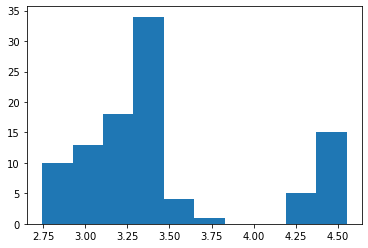

In [18]:
plt.hist(samples5_pop)
plt.show()

In [36]:
np.mean(samples5_pop)

3.458350386802099

In [21]:
def dist(u, v):
    """
    u, v are strings
    """
    uX = graph_nodes[int(u)]['xCoord']
    uY = graph_nodes[int(u)]['yCoord']
    vX = graph_nodes[int(v)]['xCoord']
    vY = graph_nodes[int(v)]['yCoord']
    dx = uX - vX
    dy = uY - vY
    return dx * dx + dy * dy

In [28]:
def compute_compactness(color_list):
    totals = []
    for color_map in color_list:
        color_synthetic_id_map = color_list_to_synthetic_id(color_map)
        total = 0.0
        for synthetic_id_list in color_synthetic_id_map.values():
            all_pairs = combinations(synthetic_id_list, 2)
            for pair in all_pairs:
                u, v = pair
                total += graph_nodes[int(u)]['populationDensity'] * graph_nodes[int(v)]['populationDensity'] * dist(u, v)
        totals.append(total)
    return totals

In [29]:
samples5_compactness = compute_compactness(samples5['color_list'])
samples5_compactness

[26653859959.15471,
 20927073956.169937,
 25666440150.479103,
 25699690087.29533,
 20931468977.391438,
 22359492293.92761,
 25797066068.026173,
 25673962912.010014,
 23430876686.323948,
 25679026788.848217,
 20951400006.867783,
 25825776738.828304,
 26046651096.695206,
 22399023002.498154,
 23016730721.160522,
 20988912302.037663,
 25707607840.895638,
 26344922302.58421,
 25796974430.552147,
 20926298997.777473,
 25781224951.303093,
 25675379184.550835,
 20936293949.097282,
 26983524959.713947,
 25686568786.351833,
 20934951404.879486,
 21961696551.952244,
 25708817579.220898,
 25641522182.99639,
 25640942417.064655,
 22400707341.87173,
 21670997857.598953,
 25587934550.12166,
 20952393237.027077,
 26354024152.97312,
 25873230374.743347,
 20930153152.194416,
 25886473746.72657,
 25839158324.524788,
 25025652890.54838,
 25972073768.56465,
 26789790378.908085,
 22202872585.92315,
 25007355307.283367,
 22342737531.78203,
 20976924897.873142,
 28395458631.553738,
 25646430873.84204,
 25825

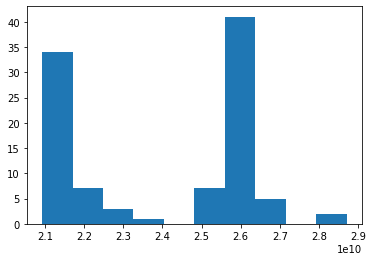

In [30]:
plt.hist(samples5_compactness)
plt.show()

In [39]:
np.mean(samples5_compactness)

23885629043.16206

In [31]:
with open('data/samples6.json', 'r') as read_file:
    samples6 = json.load(read_file)
samples6

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-08,
 'end_beta': 0.05,
 'color_list': [{'1462': 12,
   '1461': 12,
   '1460': 12,
   '1459': 12,
   '2306': 1,
   '1458': 12,
   '2305': 1,
   '1457': 12,
   '2304': 1,
   '2303': 2,
   '1456': 12,
   '2302': 2,
   '1455': 12,
   '1454': 12,
   '2301': 3,
   '2300': 3,
   '1453': 12,
   '1452': 13,
   '2309': 1,
   '2308': 1,
   '2307': 1,
   '1473': 12,
   '2320': 1,
   '1472': 12,
   '1471': 12,
   '1470': 12,
   '2317': 1,
   '0': 14,
   '2316': 1,
   '1': 14,
   '1469': 12,
   '2315': 1,
   '2': 14,
   '1468': 12,
   '3': 14,
   '2314': 1,
   '1467': 12,
   '1466': 12,
   '4': 14,
   '2313': 1,
   '1465': 12,
   '2312': 1,
   '5': 14,
   '1464': 12,
   '2311': 1,
   '6': 14,
   '7': 1,
   '1463': 12,
   '2310': 1,
   '8': 14,
   '9': 14,
   '2319': 1,
   '2318': 1,
   '1000': 7,
   '2331': 1,
   '1484': 12,
   '2330': 1,
   '1483': 12,
   '1482': 12,
   '1481': 12,
   '1480': 12,
   '2328': 1,


In [51]:
samples6_pop = compute_equipopulation(samples6['color_list'])

820000.0
750159.0
911020.0
863902.0
949639.0
385200.0
686239.0
683824.0
688048.0
686664.0
688871.0
497324.0
681776.0
351413.0
772207.0
696755.0
811285.0
816811.0
599284.0
471658.0
688931.0
688703.0
688933.0
685800.0
644451.0
691258.0
387414.0
1000589.0
790794.0
689938.0
927135.0
624298.0
460632.0
690618.0
684290.0
642129.0
687333.0
688989.0
688820.0
749365.0
961162.0
358576.0
756252.0
690053.0
832275.0
894438.0
460124.0
693260.0
688774.0
592315.0
688588.0
653551.0
925486.0
688660.0
690044.0
390259.0
810916.0
702106.0
563741.0
462908.0
697179.0
688971.0
688498.0
688050.0
653448.0
802346.0
1024984.0
688979.0
824241.0
347712.0
840646.0
859822.0
980346.0
641365.0
446117.0
771727.0
580523.0
689273.0
676529.0
419411.0
584231.0
732919.0
1072884.0
348286.0
783339.0
789780.0
737394.0
625966.0
459031.0
688354.0
687612.0
688802.0
688208.0
609000.0
731959.0
783077.0
1014467.0
357090.0
739750.0
689134.0
691234.0
839813.0
509633.0
548697.0
690147.0
689000.0
691596.0
685315.0
689492.0
719365.0
781976

794089.0
794426.0
796275.0
581946.0
453763.0
695710.0
689156.0
685385.0
684707.0
630377.0
688353.0
747480.0
1042213.0
360199.0
807513.0
698454.0
813664.0
891978.0
576321.0
467924.0
693418.0
689008.0
913744.0
688730.0
667946.0
689324.0
688142.0
357913.0
763085.0
691824.0
689041.0
828900.0
567106.0
529645.0
690313.0
689556.0
782743.0
688895.0
685314.0
662209.0
686901.0
688547.0
751671.0
691423.0
702208.0
537803.0
525893.0
690152.0
689002.0
582706.0
688900.0
689074.0
689322.0
936116.0
688512.0
781297.0
763552.0
689131.0
921381.0
774881.0
588185.0
488768.0
688961.0
688720.0
843614.0
689963.0
689038.0
729190.0
688732.0
399963.0
716063.0
687823.0
777843.0
689608.0
508811.0
687493.0
692213.0
528210.0
689451.0
686235.0
687565.0
707226.0
724515.0
861023.0
768860.0
689699.0
853194.0
878588.0
467881.0
688889.0
688239.0
604234.0
690577.0
688533.0
658222.0
917334.0
689207.0
360622.0
773009.0
828076.0
804402.0
617389.0
458363.0
690039.0
688521.0
689098.0
598298.0
688749.0
688894.0
711549.0
373529.0


In [33]:
samples6_compactness = compute_compactness(samples6['color_list'])

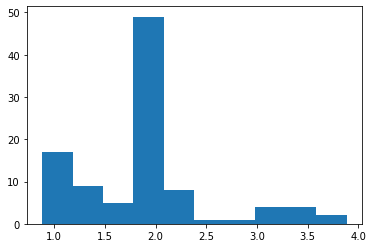

In [34]:
plt.hist(samples6_pop)
plt.show()

In [37]:
np.mean(samples6_pop)

1.9036567016923027

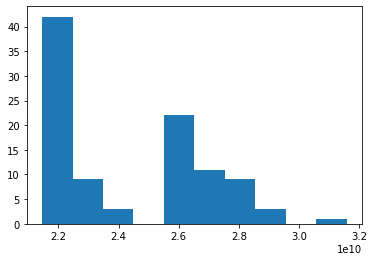

In [35]:
plt.hist(samples6_compactness)
plt.show()

In [38]:
np.mean(samples6_compactness)

24335384563.94676

In [44]:
georgia_colors = {}
for entry in graph_nodes.values():
    georgia_colors[entry['ID']] = entry['color']
georgia_colors

{0: 12,
 1: 10,
 2: 10,
 3: 12,
 4: 12,
 5: 12,
 6: 12,
 7: 13,
 8: 10,
 9: 10,
 10: 10,
 11: 10,
 12: 10,
 13: 10,
 14: 10,
 15: 10,
 16: 13,
 17: 13,
 18: 3,
 19: 13,
 20: 3,
 21: 3,
 22: 10,
 23: 10,
 24: 10,
 25: 10,
 26: 10,
 27: 10,
 28: 10,
 29: 10,
 30: 9,
 31: 9,
 32: 9,
 33: 9,
 34: 10,
 35: 10,
 36: 10,
 37: 10,
 38: 3,
 39: 3,
 40: 13,
 41: 3,
 42: 13,
 43: 4,
 44: 10,
 45: 9,
 46: 9,
 47: 9,
 48: 4,
 49: 13,
 50: 13,
 51: 13,
 52: 13,
 53: 13,
 54: 13,
 55: 13,
 56: 13,
 57: 4,
 58: 4,
 59: 4,
 60: 4,
 61: 4,
 62: 4,
 63: 4,
 64: 4,
 65: 4,
 66: 4,
 67: 4,
 68: 4,
 69: 13,
 70: 13,
 71: 3,
 72: 3,
 73: 3,
 74: 13,
 75: 3,
 76: 4,
 77: 4,
 78: 4,
 79: 4,
 80: 4,
 81: 4,
 82: 4,
 83: 6,
 84: 6,
 85: 6,
 86: 6,
 87: 6,
 88: 6,
 89: 6,
 90: 7,
 91: 6,
 92: 13,
 93: 13,
 94: 5,
 95: 4,
 96: 4,
 97: 4,
 98: 4,
 99: 13,
 100: 5,
 101: 5,
 102: 5,
 103: 13,
 104: 13,
 105: 13,
 106: 5,
 107: 13,
 108: 13,
 109: 5,
 110: 5,
 111: 9,
 112: 9,
 113: 13,
 114: 5,
 115: 13,
 116: 13,
 

In [64]:
d = {'color_list': [{str(ID): color for ID, color in georgia_colors.items()}]}
with open('data/georgia_colors.json', 'w') as f:
    json.dump(d, f)

In [50]:
georgia_pop = compute_equipopulation([georgia_colors])
georgia_pop

694472.0
686351.0
694554.0
692044.0
693876.0
692976.0
697295.0
688174.0
684958.0
693048.0
679200.0
696700.0
688442.0
661989.0


[0.12792885665909637]

In [46]:
georgia_compactness = compute_compactness([georgia_colors])
georgia_compactness

[48383044071.48574]

In [52]:
with open('data/samples8.json', 'r') as read_file:
    samples8 = json.load(read_file)
samples8

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-09,
 'end_beta': 0.05,
 'color_list': [{'1462': 10,
   '1461': 10,
   '1460': 10,
   '1459': 10,
   '2306': 9,
   '1458': 10,
   '2305': 9,
   '1457': 3,
   '2304': 9,
   '2303': 9,
   '1456': 3,
   '2302': 9,
   '1455': 3,
   '1454': 3,
   '2301': 9,
   '2300': 14,
   '1453': 3,
   '1452': 4,
   '2309': 9,
   '2308': 9,
   '2307': 9,
   '1473': 3,
   '2320': 11,
   '1472': 3,
   '1471': 3,
   '1470': 3,
   '2317': 11,
   '0': 6,
   '2316': 11,
   '1': 6,
   '1469': 10,
   '2315': 11,
   '2': 6,
   '1468': 10,
   '3': 6,
   '2314': 11,
   '1467': 3,
   '1466': 10,
   '4': 6,
   '2313': 9,
   '1465': 10,
   '2312': 9,
   '5': 6,
   '1464': 10,
   '2311': 9,
   '6': 6,
   '7': 1,
   '1463': 10,
   '2310': 9,
   '8': 6,
   '9': 6,
   '2319': 11,
   '2318': 11,
   '1000': 2,
   '2331': 1,
   '1484': 3,
   '2330': 1,
   '1483': 3,
   '1482': 3,
   '1481': 3,
   '1480': 3,
   '2328': 1,
   '2327': 11,
  

In [54]:
samples8_pop = compute_equipopulation(samples8['color_list'])

688270.0
688046.0
689010.0
688593.0
688460.0
540992.0
688853.0
689493.0
841018.0
689438.0
689170.0
689542.0
689099.0
684095.0
688449.0
689537.0
690596.0
712842.0
707106.0
688450.0
687696.0
688731.0
688908.0
688510.0
646141.0
688886.0
688923.0
689304.0
722132.0
689380.0
691735.0
689522.0
761091.0
688886.0
689860.0
691840.0
688149.0
689535.0
495050.0
688957.0
689142.0
768800.0
760365.0
690245.0
795708.0
883412.0
521179.0
693878.0
686414.0
688951.0
688926.0
762848.0
692096.0
688548.0
691677.0
399832.0
712930.0
689557.0
694071.0
715001.0
689577.0
689017.0
688803.0
621800.0
688040.0
704601.0
688948.0
686486.0
686342.0
688906.0
704961.0
692100.0
816124.0
831521.0
688800.0
688797.0
691448.0
689962.0
688875.0
689147.0
688622.0
689488.0
713574.0
370660.0
695764.0
688861.0
689583.0
691144.0
684764.0
688828.0
687543.0
689255.0
687712.0
688551.0
687665.0
686586.0
688603.0
689220.0
942446.0
699834.0
933305.0
689313.0
688915.0
673499.0
691071.0
684285.0
689048.0
690007.0
631351.0
576148.0
717473.0
3

803938.0
688681.0
688957.0
688983.0
690144.0
689629.0
688968.0
717821.0
689307.0
704683.0
390632.0
809199.0
717058.0
691383.0
689341.0
808298.0
689121.0
626187.0
687301.0
689199.0
688771.0
688920.0
688688.0
459989.0
710624.0
720741.0
698526.0
690624.0
689393.0
564494.0
689392.0
684141.0
690522.0
688874.0
685959.0
558295.0
780559.0
698050.0
804509.0
690441.0
688537.0
689242.0
691431.0
681319.0
688658.0
688246.0
688942.0
689507.0
689150.0
686923.0
691723.0
690423.0
689537.0
690470.0
689103.0
689577.0
691914.0
693660.0
688467.0
680099.0
688895.0
687822.0
689265.0
688881.0
690751.0
687711.0
687464.0


In [58]:
samples8_compactness = compute_compactness(samples8['color_list'])

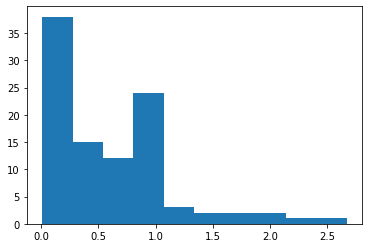

In [56]:
plt.hist(samples8_pop)
plt.show()

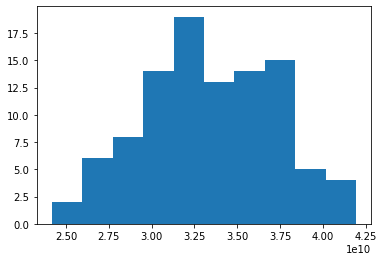

In [59]:
plt.hist(samples8_compactness)
plt.show()

In [60]:
np.mean(samples8_pop)

0.5910303098927333

In [61]:
np.mean(samples8_compactness)

33432316629.600876

In [65]:
with open('data/samples9.json', 'r') as read_file:
    samples9 = json.load(read_file)
samples9

{'num_samples': 100,
 'num_iterations': 10000,
 'beta_type': 'linear',
 'start_beta': 5e-09,
 'end_beta': 0.05,
 'color_list': [{'1462': 8,
   '1461': 8,
   '1460': 8,
   '1459': 8,
   '2306': 3,
   '1458': 6,
   '2305': 3,
   '1457': 8,
   '2304': 3,
   '2303': 3,
   '1456': 8,
   '2302': 3,
   '1455': 8,
   '1454': 8,
   '2301': 3,
   '2300': 14,
   '1453': 5,
   '1452': 5,
   '2309': 3,
   '2308': 3,
   '2307': 3,
   '1473': 8,
   '2320': 12,
   '1472': 8,
   '1471': 8,
   '1470': 8,
   '2317': 12,
   '0': 6,
   '2316': 12,
   '1': 6,
   '1469': 8,
   '2315': 12,
   '2': 6,
   '1468': 8,
   '3': 6,
   '2314': 12,
   '1467': 8,
   '1466': 6,
   '4': 6,
   '2313': 3,
   '1465': 8,
   '2312': 3,
   '5': 6,
   '1464': 8,
   '2311': 3,
   '6': 6,
   '7': 9,
   '1463': 8,
   '2310': 3,
   '8': 6,
   '9': 6,
   '2319': 12,
   '2318': 12,
   '1000': 2,
   '2331': 9,
   '1484': 8,
   '2330': 9,
   '1483': 8,
   '1482': 8,
   '1481': 8,
   '1480': 8,
   '2328': 9,
   '2327': 12,
   '1479': 8,

In [66]:
samples9_pop = compute_equipopulation(samples9['color_list'])

690565.0
691321.0
688979.0
691049.0
740016.0
689674.0
693179.0
688294.0
755333.0
688940.0
494154.0
689594.0
687916.0
755065.0
786509.0
694336.0
691038.0
689964.0
689328.0
692404.0
688766.0
691401.0
687935.0
763094.0
689014.0
751985.0
704747.0
423558.0
688951.0
688795.0
689913.0
688696.0
688654.0
688636.0
688727.0
688881.0
689346.0
688935.0
688498.0
689139.0
687974.0
688934.0
689769.0
689006.0
689275.0
689245.0
686987.0
722773.0
666940.0
689229.0
687792.0
685400.0
679027.0
686562.0
691678.0
690396.0
688844.0
688963.0
689099.0
688594.0
689675.0
689037.0
688797.0
687868.0
688834.0
688818.0
688517.0
688827.0
688889.0
689317.0
688883.0
689562.0
688606.0
689308.0
689240.0
686689.0
690195.0
688258.0
689425.0
688707.0
688922.0
687626.0
689571.0
689087.0
688581.0
688417.0
693584.0
694578.0
688892.0
679639.0
688041.0
689615.0
687977.0
689007.0
689128.0
688859.0
688471.0
689290.0
688651.0
688021.0
689548.0
688954.0
687541.0
688901.0
689049.0
689277.0
689099.0
688967.0
690466.0
688732.0
688075.0
6

688679.0
758433.0
689469.0
691168.0
688725.0
692699.0
687658.0
689263.0
689614.0
690124.0
704100.0
446490.0
840086.0
687571.0
720633.0
689370.0
694323.0
806295.0
691339.0
688240.0
691183.0
690954.0
689307.0
832810.0
690361.0
700586.0
690604.0
368074.0
691593.0
689963.0
687087.0
776427.0
718266.0
689773.0
685169.0
689269.0
687808.0
689879.0
690418.0
473436.0
687849.0
787142.0
703578.0
689845.0
895529.0
735477.0
690042.0
688913.0
691016.0
689283.0
690905.0
683649.0
736881.0
688854.0
694871.0
365236.0
721228.0
691193.0
693168.0
689612.0
688819.0
690095.0
688869.0
687804.0
816129.0
689912.0
688024.0
704395.0
414523.0
780308.0
690696.0
688957.0
688466.0
687376.0
692949.0
688769.0
689605.0
688998.0
688787.0
690124.0
688966.0
683111.0
687645.0
689630.0
787394.0
692063.0
689073.0
703125.0
689440.0
689623.0
688079.0
689187.0
441355.0
691562.0
687816.0
711897.0
766368.0
717097.0
691972.0
689227.0
693429.0
693471.0
688502.0
689325.0
689052.0
688678.0
688712.0
682310.0
690589.0
685623.0
682021.0
6

In [67]:
samples9_compactness = compute_compactness(samples9['color_list'])

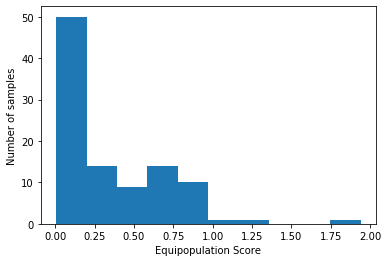

In [76]:
plt.hist(samples9_pop)
plt.xlabel('Equipopulation Score')
plt.ylabel('Number of samples')
plt.show()

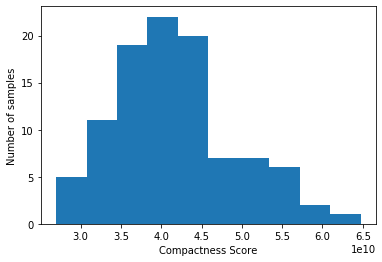

In [77]:
plt.hist(samples9_compactness)
plt.xlabel('Compactness Score')
plt.ylabel('Number of samples')
plt.show()

In [70]:
np.mean(samples9_pop)

0.3353151607323003

In [74]:
np.median(samples9_pop)

0.20025250726378385

In [71]:
np.mean(samples9_compactness)

41916000166.12649

In [75]:
np.median(samples9_compactness)

41217048928.30822

In [78]:
min(samples9_pop)

0.0050439238417686605

In [79]:
max(samples9_pop)

1.9399542455013075

In [80]:
min_index = min(range(len(samples9_pop)), key=lambda i: samples9_pop[i])
print(min_index, samples9_pop[min_index])
samples9_compactness[min_index]

27 0.0050439238417686605


55375745208.44546

In [82]:
def compute_min_max_pop(color_list):
    totals = []
    for color_map in color_list:
        color_synthetic_id_map = color_list_to_synthetic_id(color_map)
        best_min = float('inf')
        best_max = float('-inf')
        for synthetic_id_list in color_synthetic_id_map.values():
            current_total = 0.0
            for synth_id in synthetic_id_list:
                current_total += graph_nodes[int(synth_id)]['population']     
            best_min = min(best_min, current_total)
            best_max = max(best_max, current_total)
            print(best_min, best_max)
        totals.append((best_min, best_max))
    return totals

In [83]:
samples9_min_max = compute_min_max_pop(samples9['color_list'])
samples9_min_max

690565.0 690565.0
690565.0 691321.0
688979.0 691321.0
688979.0 691321.0
688979.0 740016.0
688979.0 740016.0
688979.0 740016.0
688294.0 740016.0
688294.0 755333.0
688294.0 755333.0
494154.0 755333.0
494154.0 755333.0
494154.0 755333.0
494154.0 755333.0
786509.0 786509.0
694336.0 786509.0
691038.0 786509.0
689964.0 786509.0
689328.0 786509.0
689328.0 786509.0
688766.0 786509.0
688766.0 786509.0
687935.0 786509.0
687935.0 786509.0
687935.0 786509.0
687935.0 786509.0
687935.0 786509.0
423558.0 786509.0
688951.0 688951.0
688795.0 688951.0
688795.0 689913.0
688696.0 689913.0
688654.0 689913.0
688636.0 689913.0
688636.0 689913.0
688636.0 689913.0
688636.0 689913.0
688636.0 689913.0
688498.0 689913.0
688498.0 689913.0
687974.0 689913.0
687974.0 689913.0
689769.0 689769.0
689006.0 689769.0
689006.0 689769.0
689006.0 689769.0
686987.0 689769.0
686987.0 722773.0
666940.0 722773.0
666940.0 722773.0
666940.0 722773.0
666940.0 722773.0
666940.0 722773.0
666940.0 722773.0
666940.0 722773.0
666940.0 7

683455.0 831915.0
683455.0 831915.0
683455.0 831915.0
683455.0 831915.0
461723.0 831915.0
461723.0 831915.0
461723.0 831915.0
461723.0 831915.0
688923.0 688923.0
688285.0 688923.0
688285.0 688923.0
688285.0 689273.0
688285.0 689448.0
688285.0 689635.0
687975.0 689635.0
687975.0 689635.0
687952.0 689635.0
687850.0 689635.0
687850.0 689635.0
687850.0 689635.0
687850.0 689635.0
687850.0 689785.0
688853.0 688853.0
688706.0 688853.0
688706.0 688918.0
688706.0 688918.0
688706.0 688918.0
688450.0 688918.0
688450.0 688918.0
688450.0 688962.0
688450.0 689302.0
688450.0 689894.0
688450.0 689894.0
688450.0 690129.0
688123.0 690129.0
687544.0 690129.0
688579.0 688579.0
688579.0 689573.0
688262.0 689573.0
688262.0 689573.0
688262.0 689573.0
688262.0 689573.0
688262.0 689573.0
688262.0 689573.0
687455.0 689573.0
687455.0 689573.0
686295.0 689573.0
686295.0 691777.0
686295.0 691777.0
686295.0 691777.0
692788.0 692788.0
688930.0 692788.0
688930.0 692788.0
688930.0 692788.0
688882.0 692788.0
687944.0 6

687616.0 687616.0
687616.0 687913.0
687616.0 688916.0
687616.0 688916.0
687504.0 688916.0
675448.0 688916.0
675448.0 691074.0
675448.0 691074.0
675448.0 691074.0
675448.0 691074.0
675448.0 691074.0
675448.0 691074.0
675448.0 704920.0
675448.0 704920.0
698717.0 698717.0
691144.0 698717.0
691144.0 707402.0
689329.0 707402.0
689329.0 707402.0
689143.0 707402.0
689143.0 707402.0
688972.0 707402.0
688972.0 707402.0
687960.0 707402.0
687960.0 707402.0
589485.0 707402.0
589485.0 707402.0
589485.0 750653.0
690920.0 690920.0
690620.0 690920.0
690620.0 699682.0
690620.0 699682.0
690620.0 699682.0
689286.0 699682.0
689286.0 699682.0
688870.0 699682.0
688870.0 699682.0
688870.0 699682.0
688862.0 699682.0
619228.0 699682.0
619228.0 699682.0
619228.0 726829.0
704075.0 704075.0
691223.0 704075.0
689822.0 704075.0
686752.0 704075.0
686752.0 704075.0
686752.0 704075.0
686529.0 704075.0
686529.0 704075.0
686529.0 704075.0
682363.0 704075.0
682363.0 704075.0
679232.0 704075.0
679232.0 704075.0
679232.0 7

[(494154.0, 755333.0),
 (423558.0, 786509.0),
 (687974.0, 689913.0),
 (666940.0, 722773.0),
 (687868.0, 689675.0),
 (686689.0, 690195.0),
 (679639.0, 694578.0),
 (687541.0, 690466.0),
 (619111.0, 733021.0),
 (678904.0, 713651.0),
 (687856.0, 691417.0),
 (599600.0, 717887.0),
 (570996.0, 845320.0),
 (547246.0, 764221.0),
 (688044.0, 689370.0),
 (686634.0, 690519.0),
 (687744.0, 689518.0),
 (683865.0, 690221.0),
 (442189.0, 810165.0),
 (418200.0, 793726.0),
 (682873.0, 690839.0),
 (687478.0, 691046.0),
 (687938.0, 690886.0),
 (679070.0, 694271.0),
 (687525.0, 689755.0),
 (663162.0, 697550.0),
 (382224.0, 811832.0),
 (688420.0, 689407.0),
 (480431.0, 861145.0),
 (616304.0, 812213.0),
 (680407.0, 691308.0),
 (608757.0, 723996.0),
 (395990.0, 827843.0),
 (598544.0, 744732.0),
 (540236.0, 820379.0),
 (561565.0, 732456.0),
 (687642.0, 690767.0),
 (687680.0, 690607.0),
 (436557.0, 875513.0),
 (585785.0, 793104.0),
 (346505.0, 859015.0),
 (648848.0, 720202.0),
 (571701.0, 813107.0),
 (364089.0,

In [87]:
samples9_diff = list(map(lambda t: t[1] - t[0], samples9_min_max))
samples9_diff

[261179.0,
 362951.0,
 1939.0,
 55833.0,
 1807.0,
 3506.0,
 14939.0,
 2925.0,
 113910.0,
 34747.0,
 3561.0,
 118287.0,
 274324.0,
 216975.0,
 1326.0,
 3885.0,
 1774.0,
 6356.0,
 367976.0,
 375526.0,
 7966.0,
 3568.0,
 2948.0,
 15201.0,
 2230.0,
 34388.0,
 429608.0,
 987.0,
 380714.0,
 195909.0,
 10901.0,
 115239.0,
 431853.0,
 146188.0,
 280143.0,
 170891.0,
 3125.0,
 2927.0,
 438956.0,
 207319.0,
 512510.0,
 71354.0,
 241406.0,
 596192.0,
 355446.0,
 15255.0,
 370192.0,
 1935.0,
 2585.0,
 5482.0,
 13027.0,
 7202.0,
 256265.0,
 1718.0,
 405177.0,
 72820.0,
 539198.0,
 165264.0,
 114840.0,
 6642.0,
 186108.0,
 91440.0,
 22096.0,
 2339.0,
 78810.0,
 440485.0,
 72890.0,
 4828.0,
 12878.0,
 223638.0,
 366190.0,
 320736.0,
 236425.0,
 411094.0,
 11540.0,
 467810.0,
 141086.0,
 409316.0,
 101942.0,
 1763.0,
 393596.0,
 464736.0,
 313706.0,
 530293.0,
 401606.0,
 9838.0,
 346039.0,
 11450.0,
 65485.0,
 115360.0,
 6887.0,
 228807.0,
 352430.0,
 7001.0,
 437314.0,
 578681.0,
 29472.0,
 161168.0

In [ ]:
samples9_max = list(map())
samples9_max

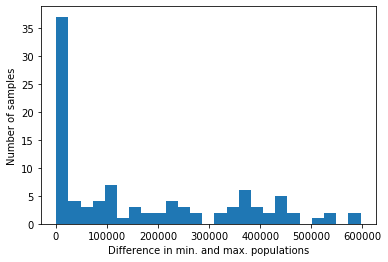

In [99]:
plt.hist(samples9_diff, bins=25)
plt.xlabel('Difference in min. and max. populations')
plt.ylabel('Number of samples')
plt.show()

In [92]:
np.median(samples9_diff)

110755.5

In [93]:
compute_min_max_pop([georgia_colors])

694472.0 694472.0
686351.0 694472.0
686351.0 694554.0
686351.0 694554.0
686351.0 694554.0
686351.0 694554.0
686351.0 697295.0
686351.0 697295.0
684958.0 697295.0
684958.0 697295.0
679200.0 697295.0
679200.0 697295.0
679200.0 697295.0
661989.0 697295.0


[(661989.0, 697295.0)]

In [94]:
697295.0 - 661989.0

35306.0

In [100]:
def compute_max_equipop(color_list):
    totals = []
    for color_map in color_list:
        color_synthetic_id_map = color_list_to_synthetic_id(color_map)
        best_max = float('-inf')
        for synthetic_id_list in color_synthetic_id_map.values():
            current_total = 0.0
            for synth_id in synthetic_id_list:
                current_total += graph_nodes[int(synth_id)]['population']
            best_max = max(best_max, abs((current_total / pop_parity) - 1))
            print(best_max)
        totals.append(best_max)
    return totals

In [101]:
samples9_max = compute_max_equipop(samples9['color_list'])
samples9_max

0.002471049853490559
0.003568510792995472
0.003568510792995472
0.003568510792995472
0.07425747964113527
0.07425747964113527
0.07425747964113527
0.07425747964113527
0.09649267700938591
0.09649267700938591
0.2826524958992973
0.2826524958992973
0.2826524958992973
0.2826524958992973
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.14174987575278064
0.3851344436311648
0.00012805784772185191
0.00012805784772185191
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0015245623765629546
0.0013155221976095532
0.0013155221976095532
0.0013155221976095532
0.0013155221976095532
0.002723017926335891
0.049226369879384
0.04

0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.051001759732578034
0.11628699847854829
0.11628699847854829
0.11628699847854829
0.11628699847854829
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.08852302018679037
0.4251540245574512
0.4251540245574512
0.014531506844769781
0.014531506844769781
0.014531506844769781
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.08110354550185672
0.131112882837231
0.131112882837231
0.19091786784409392
0.19091786784409392
0.19091786784409392
0.19091786784409392
0.19091786784409392
0.19091786784409392
0.19091786784409392
0.21575673529

0.012269808241927471
0.012269808241927471
0.012269808241927471
0.03277897246590378
0.03277897246590378
0.03277897246590378
0.03277897246590378
0.07303310145012287
0.07303310145012287
0.07303310145012287
0.07303310145012287
0.07303310145012287
0.07303310145012287
0.07303310145012287
0.0017423125629725256
0.0017423125629725256
0.0017423125629725256
0.0017423125629725256
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.004010647361971986
0.0003785742526579705
0.0003785742526579705
0.0026794678890539325
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.004780031353952996
0.013914547983275627
0.00038728426011436223
0.00038728426011436223
0.015502672676157125
0.015502672676157125
0.15131056060407633
0.151310560604

[0.2826524958992973,
 0.3851344436311648,
 0.0015245623765629546,
 0.049226369879384,
 0.0014440984981561877,
 0.003155614963336495,
 0.013389873724592993,
 0.0023273347304599845,
 0.10125642894464049,
 0.03598425520985482,
 0.0037078709122977394,
 0.1295799215249066,
 0.22712391717239155,
 0.20558054325353403,
 0.0011886049461020676,
 0.003235456698353456,
 0.0016241053189215426,
 0.007255125139476681,
 0.35808841881116893,
 0.3929124802897197,
 0.008695179705599632,
 0.0031693021179108882,
 0.002937035252407183,
 0.01421587276504055,
 0.0019420205910797295,
 0.037309005867745326,
 0.44513768499822526,
 0.0007900184144074007,
 0.3025737346199673,
 0.179063547695949,
 0.012274992770175297,
 0.11628699847854829,
 0.4251540245574512,
 0.131112882837231,
 0.21575673529841466,
 0.18479411045886285,
 0.002764286771188784,
 0.002532019905685079,
 0.366264212476899,
 0.15132362561526103,
 0.49698981105401563,
 0.058088180322869554,
 0.18036133880695093,
 0.4714636825351596,
 0.342931554169143

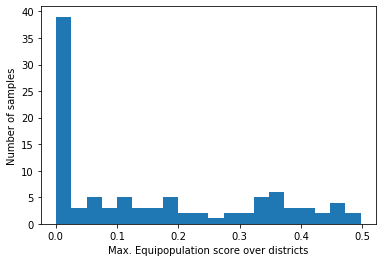

In [109]:
plt.hist(samples9_max, bins=20)
plt.xlabel('Max. Equipopulation score over districts')
plt.ylabel('Number of samples')
plt.show()

In [104]:
np.mean(samples9_max)

0.15595058273579052

In [106]:
np.median(samples9_max)

0.09747265653879439

In [107]:
compute_max_equipop([georgia_colors])

0.008142716375508785
0.008142716375508785
0.008261753144079398
0.008261753144079398
0.008261753144079398
0.008261753144079398
0.012240774883739647
0.012240774883739647
0.012240774883739647
0.012240774883739647
0.014027155936818803
0.014027155936818803
0.014027155936818803
0.03901181232546924


[0.03901181232546924]